# Visualizer Notebook
### Just a helper notebook/snippets to print out images in NIFTI format
### As part of the Deep Learning course project

#### Background:
MRI images need to be stored in a non-compressable format so as not to cause any data loss nor require computational power to be read on the very weak medical devices whose hardware might not handle de-compressing large images.
Images should hold medical metadata.

The two widely used image formats are 1- DICOM (.dcm) and 2- NIFTI (.nii or .nii.gz)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import animation
import random
import time
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob


# the one library to handle nii images
import nibabel as nib

In [ ]:
PROBLEM_TYPE = "CINE" #We must choose either of CINE or LGE (the LGE is just the same heart but injected with a material that enhances contrast)
IMAGE_TYPE = "4CH" #Available types are 2CH, 4CH and SAX (and additional RAS for LGE)

sample_n = 90 #Just change the number of the example sample from here
sample_n = str(sample_n).rjust(3, '0')


# I just made some boilerplate that reads directories based on the type of images
# Just change any path you want, but consider the aftermath of doing so (I hate my spaghetti coding skills)
DATASET_FOLDER_NAME = f"..\\CMR-MULTI\\{PROBLEM_TYPE}_MULTI\\{IMAGE_TYPE}_TR\\image"
LABEL_FOLDER_NAME = f"..\\CMR-MULTI\\{PROBLEM_TYPE}_MULTI\\{IMAGE_TYPE}_TR\\anno"

PATH_DATASET = os.path.join(os.getcwd(), DATASET_FOLDER_NAME)
PATH_LABEL = os.path.join(os.getcwd(), LABEL_FOLDER_NAME)

Example_Train_NII_Path = os.path.join(PATH_DATASET, f"{PROBLEM_TYPE}_{IMAGE_TYPE}_{sample_n}.nii.gz") 
Example_Label_NII_Path = os.path.join(PATH_LABEL, f"{PROBLEM_TYPE}_{IMAGE_TYPE}_{sample_n}.nii.gz")

I will just make a lable dictionary so that the labels make sense when they are drawn on the images

In [3]:
if PROBLEM_TYPE == "CINE":
    LBLS_2CH = {0: "[0] none", 1 : "[1] Left Ventricle Cavity", 2: "[2] Left Ventricle Myocardium"}
    LBLS_4CH = {0: "[0] none", 1 : "[1] Left Ventricle Cavity", 2 : "[2] Left Ventricle Myocardium", 3 : "[3] Right Ventricle Cavity", 4 : "[4] Right Atrium", 5 : "[5] Left Atrium"}
    LBLS_SAX = {0: "[0] none", 1 : "[1] Left Ventricle Myocardium", 2 : "[2] Left Ventricle Cavity", 3 : "[3] Right Ventricle Cavity"}
    LBLS_RAS = None

elif PROBLEM_TYPE == "LGE":
    LBLS_2CH = {0: "[0] none", 1 : "[1] Left Ventricle Cavity", 2: "[2] Left Ventricle Myocardium", 3 : "[3] Myocardial Scar (Scar)"}
    LBLS_4CH = {0: "[0] none", 1 : "[1] Left Ventricle Cavity", 2 : "[2] Left Ventricle Myocardium", 3 : "[3] Myocardial Scar (Scar)", 4 : "[4] Right Ventricle Cavity"}
    LBLS_SAX = {0: "[0] none", 1 : "[1] Left Ventricle Cavity", 2 : "[2] Left Ventricle Myocardium", 3 : "[3] Myocardial Scar (Scar)", 4 : "[4] Right Ventricle Cavity"}
    LBLS_RAS = {0: "[0] none", 1 : "[1] Right Atrium"}

label_dict = {"2CH" : LBLS_2CH, "4CH": LBLS_4CH, "SAX" : LBLS_SAX, "RAS": LBLS_RAS}
current_labels = label_dict[IMAGE_TYPE] #We'll use this dictionary as a lookup for description of each label.

In [4]:
Example_Reading_Train_NII = nib.load(Example_Train_NII_Path)
Example_Reading_Label_NII = nib.load(Example_Label_NII_Path)

print(type(Example_Reading_Train_NII))
print(Example_Reading_Train_NII) # general info

<class 'nibabel.nifti1.Nifti1Image'>

<class 'nibabel.nifti1.Nifti1Image'>
data shape (169, 155, 75)
affine:
[[-1.37558818e+00 -4.11483832e-02 -1.75284091e-02  7.83625488e+01]
 [-6.06346242e-02 -1.36965203e+00  6.83456361e-02  1.38926376e+02]
 [-1.73263356e-01  8.06007445e-01  1.15245171e-01 -5.25570793e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b''
dim_info        : 0
dim             : [  3 169 155  75   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [1.        1.3877822 1.5897446 0.1351289 1.        1.        1.
 1.       ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : u

In [5]:
print(Example_Reading_Train_NII.get_data_dtype()) #Notice that data is stored as float not integers

print(Example_Reading_Train_NII.get_filename()) # Just printing the full path as a sanity check

float32
c:/Users/ayman.mohamed/Personal/Masters_Security/Deep_Learning/CINE_Cardiac_MRI_With_Deep_Learning/CMR-MULTI/CINE_MULTI/4CH_TR/image/CINE_4CH_090.nii.gz


In [6]:
print(Example_Reading_Train_NII.get_fdata()) # This is the actual image pixels, returned as numpy array

[[[ 11.17857456  31.75528717  29.70185089 ...  15.20041084  12.46380997
     7.35683346]
  [ 16.85990715  27.18286896  27.00943947 ...  14.62348747  15.35825539
     8.78112221]
  [ 23.92598724  14.59162045  12.23783207 ...  18.27548218  24.691782
    22.96316147]
  ...
  [ 55.29571533  53.38365936  63.75448608 ...  41.75291061  44.1607666
    48.30401611]
  [ 62.13169479  30.08289719  66.6977005  ... 155.56626892 153.34365845
   154.76568604]
  [ 50.8868866   39.58972931  38.4664917  ... 164.3808136  162.47897339
   159.65922546]]

 [[ 11.20943928  28.05994415  22.68154144 ...  21.50522041  22.96340942
    16.89401627]
  [ 17.08157158  18.4481678   19.32974815 ...  25.5972805   26.05426598
    16.55340767]
  [ 21.94784355  13.1606226   15.576828   ...  17.44774818  22.48916817
    23.27180672]
  ...
  [ 36.90317917  38.20385742  33.91396332 ...  35.57997894  48.88867188
    59.8782692 ]
  [ 50.30491638  41.35130692  34.7359314  ... 173.20121765 177.53033447
   184.54167175]
  [ 62.261

### I can see that each pixel value has a non-conventional value
All pixels are floats, some pixels are greater than 1, some pixels are greater than 255 and even some pixels are greater than 700!
What is this distribution???
Digging deeper into this distribution and maybe we can normalize those values later as part of preprocessing

max value in all pixels is 5005.86376953125


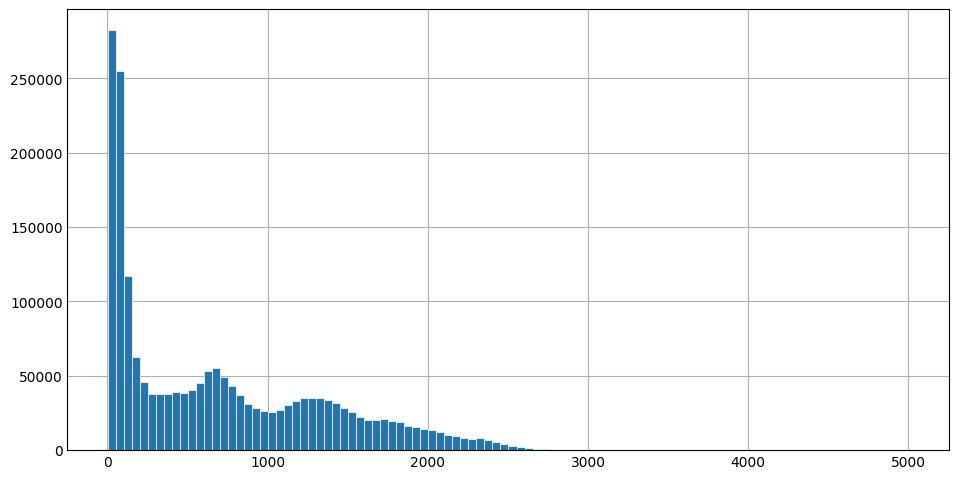

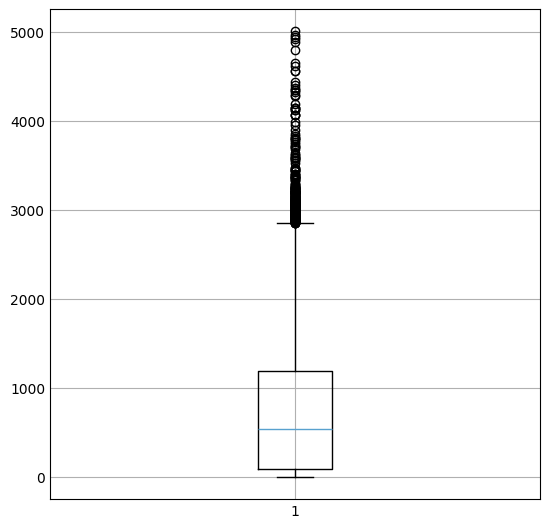

In [40]:
# Just a helper function that flattens a big nested list recursively
# we will use this to get ALL pixel values in a picture so we can explore their distribution
def recursive_flatten (input_list):
    if type(input_list) not in [list, np.ndarray]: #base case
        return input_list
    
    prev_list = []
    for element in input_list:
        if type(element) not in [list, np.ndarray]:
            prev_list.append(element)
        else:
            prev_list += recursive_flatten(element)
    
    return prev_list

all_pixel_values = recursive_flatten(Example_Reading_Train_NII.get_fdata())
max_val = max(all_pixel_values)
print(f"max value in all pixels is {max_val}")
# print(all_pixel_values)



plt.style.use('_mpl-gallery')
# plot:s
fig, ax = plt.subplots(figsize=(9, 4.5))
ax.hist(all_pixel_values, bins=100, linewidth=0.5, edgecolor="white")
plt.show()

fig, ax = plt.subplots(figsize=(5, 5))
ax.boxplot(all_pixel_values)
plt.show()

### Concluding the previous data analytics...
We can see that the values are overshooting to thousands (IDK what is the measuring unit of values here).
Clearly data is of high variance.
And we can see a lot of outliers.
This is only from 1 sample of data, we didn't even explore the whole dataset files, we have to perform some sort of normalization as part of preprocessing!

### Dimensions
Each nii.gz file is 1 image (having a height and width), and it has multiple channels (depth)

the image is 3d image, having width, height and depth.

Sometimes, they call the depth by "slices"

Each slice is a شريحة or a literal "slice" from the heart.

In [8]:
print(Example_Reading_Train_NII.get_fdata().shape) # Dimensions

(169, 155, 75)


In [9]:
Example_ALL_Images = Example_Reading_Train_NII.get_fdata()
Example_ALL_Labels = Example_Reading_Label_NII.get_fdata()

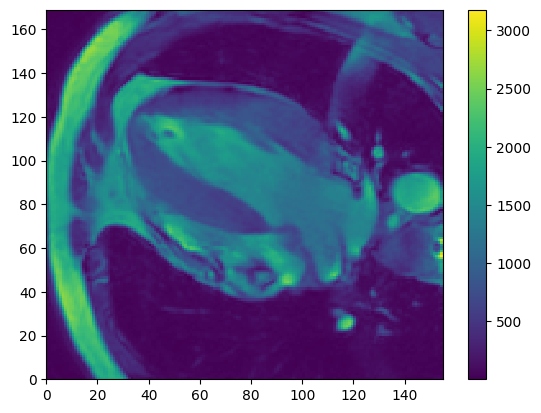

In [18]:
plt.pcolormesh(Example_ALL_Images[:, :, 10])
plt.colorbar()

[Text(1, 0, '[0] none'),
 Text(1, 1, '[1] Left Ventricle Cavity'),
 Text(1, 2, '[2] Left Ventricle Myocardium'),
 Text(1, 3, '[3] Right Ventricle Cavity'),
 Text(1, 4, '[4] Right Atrium'),
 Text(1, 5, '[5] Left Atrium')]

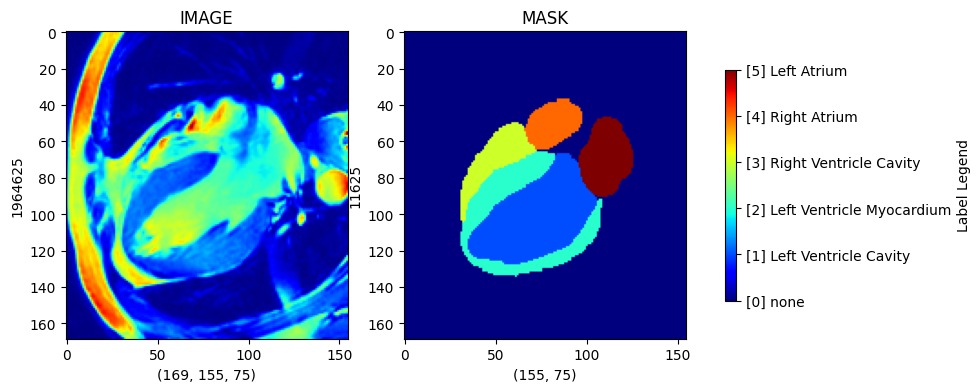

In [11]:
figure, axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Example_ALL_Images[:, :, Example_ALL_Images.shape[2]//2],cmap="jet")
axis[0].set_xlabel(Example_ALL_Images.shape)
axis[0].set_ylabel(Example_ALL_Images.size)
axis[0].set_title("IMAGE")

Plot_Color_Op = axis[1].imshow(Example_ALL_Labels[:, :, Example_ALL_Images.shape[2]//2],cmap="jet")
axis[1].set_xlabel(Example_ALL_Labels[Example_ALL_Images.shape[0]//2].shape)
axis[1].set_ylabel(Example_ALL_Labels[Example_ALL_Images.shape[0]//2].size)
axis[1].set_title("MASK")

cbar = figure.colorbar(Plot_Color_Op, ax=axis.ravel().tolist(), shrink=0.3, ticks=list(current_labels.keys()), label='Label Legend')
cbar.ax.set_yticklabels(list(current_labels.values()))

### Let's try more colors, I don't know what do the colors stand for, but let's try :)

[Text(1, 0, '[0] none'),
 Text(1, 1, '[1] Left Ventricle Cavity'),
 Text(1, 2, '[2] Left Ventricle Myocardium'),
 Text(1, 3, '[3] Right Ventricle Cavity'),
 Text(1, 4, '[4] Right Atrium'),
 Text(1, 5, '[5] Left Atrium')]

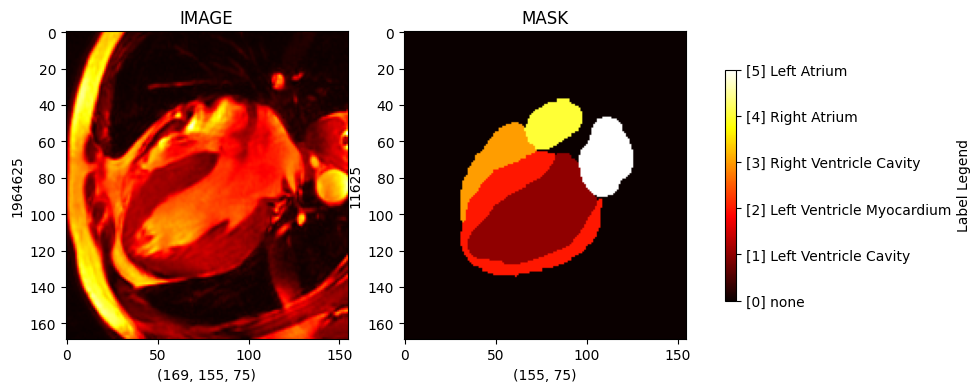

In [12]:
figure,axis = plt.subplots(1,2,figsize=(10,10))


axis[0].imshow(Example_ALL_Images[:, :, Example_ALL_Images.shape[2]//2],cmap="hot")
axis[0].set_xlabel(Example_ALL_Images.shape)
axis[0].set_ylabel(Example_ALL_Images.size)
axis[0].set_title("IMAGE")

Plot_Color_Op = axis[1].imshow(Example_ALL_Labels[:, :, Example_ALL_Images.shape[2]//2],cmap="hot")
axis[1].set_xlabel(Example_ALL_Labels[Example_ALL_Images.shape[0]//2].shape)
axis[1].set_ylabel(Example_ALL_Labels[Example_ALL_Images.shape[0]//2].size)
axis[1].set_title("MASK")

cbar = figure.colorbar(Plot_Color_Op, ax=axis.ravel().tolist(), shrink=0.3, ticks=list(current_labels.keys()), label='Label Legend')
cbar.ax.set_yticklabels(list(current_labels.values()))

[Text(1, 0, '[0] none'),
 Text(1, 1, '[1] Left Ventricle Cavity'),
 Text(1, 2, '[2] Left Ventricle Myocardium'),
 Text(1, 3, '[3] Right Ventricle Cavity'),
 Text(1, 4, '[4] Right Atrium'),
 Text(1, 5, '[5] Left Atrium')]

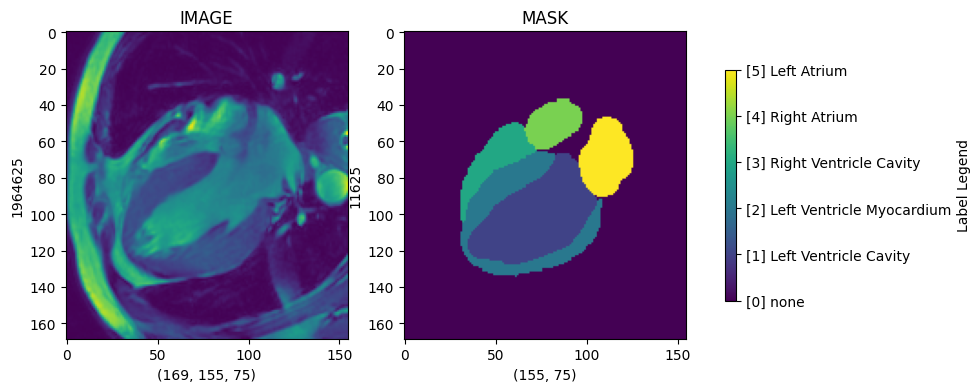

In [13]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Example_ALL_Images[:, :, Example_ALL_Images.shape[2]//2])
axis[0].set_xlabel(Example_ALL_Images.shape)
axis[0].set_ylabel(Example_ALL_Images.size)
axis[0].set_title("IMAGE")

Plot_Color_Op = axis[1].imshow(Example_ALL_Labels[:, :, Example_ALL_Labels.shape[2]//2])
axis[1].set_xlabel(Example_ALL_Labels[Example_ALL_Labels.shape[0]//2].shape)
axis[1].set_ylabel(Example_ALL_Labels[Example_ALL_Labels.shape[0]//2].size)
axis[1].set_title("MASK")

cbar = figure.colorbar(Plot_Color_Op, ax=axis.ravel().tolist(), shrink=0.3, ticks=list(current_labels.keys()), label='Label Legend')
cbar.ax.set_yticklabels(list(current_labels.values()))

### Let's see all slices in an animated manner

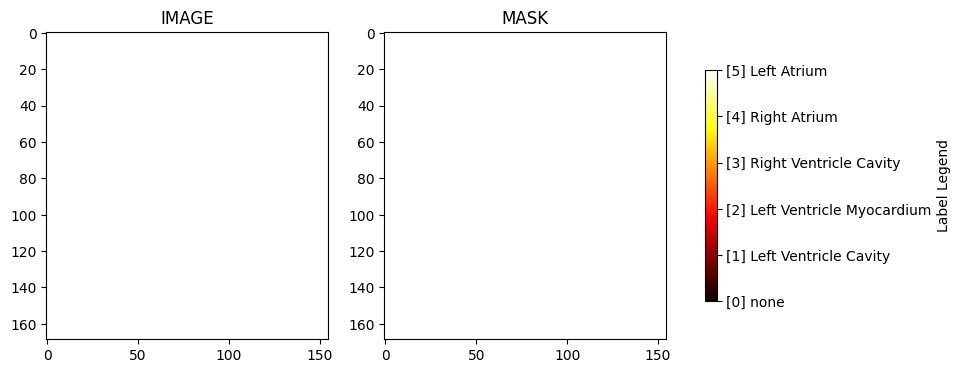

In [14]:
from IPython.display import HTML #This is just so we can visualize gifs inside vscode

fig, axis = plt.subplots(1, 2, figsize=(10, 10))

frames = []
for i in range(Example_ALL_Images.shape[2]):
    img = axis[0].imshow(Example_ALL_Images[:, :, i], animated=True, cmap='grey') # Add cmap='hot' or 'jet' or 'grey' for more cool colors
    axis[0].set_title("IMAGE")

    mask = axis[1].imshow(Example_ALL_Labels[:, :, i], animated=True, cmap='hot') # Add cmap='hot' or 'jet' or 'grey' for more cool colors
    axis[1].set_title("MASK")

    # Store both images as one frame
    frames.append([img, mask])


cbar = fig.colorbar(mask, ax=axis.ravel().tolist(), shrink=0.3, ticks=list(current_labels.keys()), label='Label Legend')
cbar.ax.set_yticklabels(list(current_labels.values()))


ani = mpl.animation.ArtistAnimation(fig=fig, artists=frames, interval=100)
HTML(ani.to_jshtml()) #Just to make vscode render a video

### What??
### Those images are not static 3d images (width x height x slices)

### Those images are arrays of 3d frames, so, a video

### and not only that xD, I noticed that those arrays of frames repeat a few times although the stream of frames did not finish yet.

### meaning that each "image" sample is a bunch of videos for each slice of the heart.

### in other words, 1 patient sample contains K videos (where K is the number of slices). and each video is just an array of frames. That's a weird image format.
Let's now try to extract the number K, so that we can dissect a single sample into slices.

# Warning
#### Take care that some annotated data is WRONG
#### Ex: have a look at sample number 105 in 4CH CINE problem, the first ever frame is annotated wrong (look at the first frame and second frame annotations to confirm).